In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import altair as alt
from sublimpy import utils
from sublimpy import variables
from sublimpy import tidy
from metpy.units import units
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import scipy.integrate
from scipy.optimize import curve_fit

In [2]:
fn = "/Users/elischwat/Development/data/sublimationofsnow/infrared_camera/250917_for_Eli/230517_120045_frames14000_to_66999_avg300.nc"

# Open a subset of one large file

In [3]:
# ds = xr.open_dataset(fn, chunks="auto")  # Lazily opens the NetCDF file with Dask

# # Get a slice so we just do a bit of processing
# ds = ds.compute()

ds = xr.open_dataset(fn, chunks="auto")  # Lazily opens the NetCDF file with Dask
ds = ds.compute() # it's not that big (right now)

# Define the starting time and timestep
start_time = pd.Timestamp("2023-05-17 12:00:00")
timestep = pd.Timedelta(seconds=10)
# calculate a time coordinate
time_values = start_time + ds['frame'] * timestep
ds = ds.assign_coords(time=("frame", pd.Index(time_values)))

In [4]:
# ds = ds.sel(frame = slice(None, int(len(ds.frame)/2)))
# ds = ds.sel(frame = slice(int(len(ds.frame)/2), None))
ds.time.min(), ds.time.max()

(<xarray.DataArray 'time' ()> Size: 8B
 array('2023-05-17T12:00:00.000000000', dtype='datetime64[ns]'),
 <xarray.DataArray 'time' ()> Size: 8B
 array('2023-05-17T12:29:10.000000000', dtype='datetime64[ns]'))

Text(0, 0.5, 'IR temperature over snow')

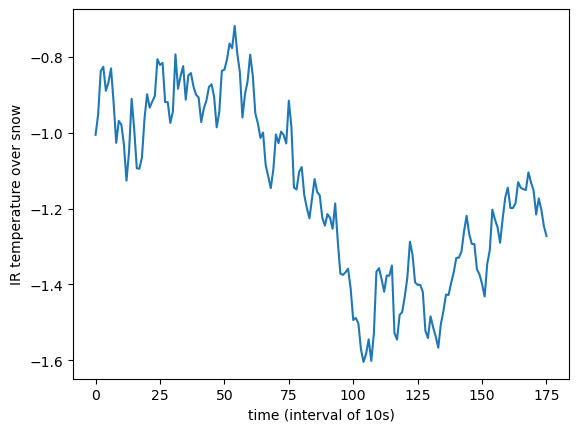

In [5]:
ds.sel(row=slice(425,450), col=slice(400,500))['irdata'].mean(dim=['col', 'row']).plot()
plt.xlabel('time (interval of 10s)')
plt.ylabel('IR temperature over snow')

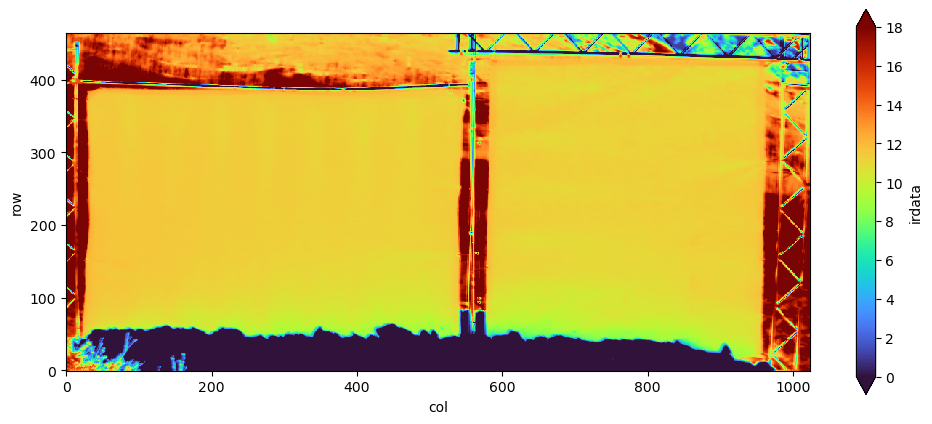

In [6]:
plt.figure(figsize=(12,5))
# Let's just use 1 frame
ds_mean = ds['irdata'].mean(dim='frame')

# Transpoe and then reverse rows so that it plots in a visually-spatially-correct way
ds_mean = ds_mean.T
ds_mean = ds_mean[::-1,::]
ds_mean.plot(vmin=0,vmax=18, cmap='turbo')
plt.gca().set_aspect('equal')

find the "ground" - where the left pole "ends"

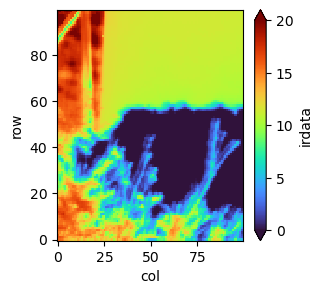

In [7]:
ds_mean.sel(
    row=slice(0,100),
    col=slice(0, 100),
).plot(vmin=0,vmax=20, cmap='turbo', figsize=(3,3))

In [8]:
ds_mean_cropped = ds_mean.sel(row=slice(25,ds_mean.row.values.max()))

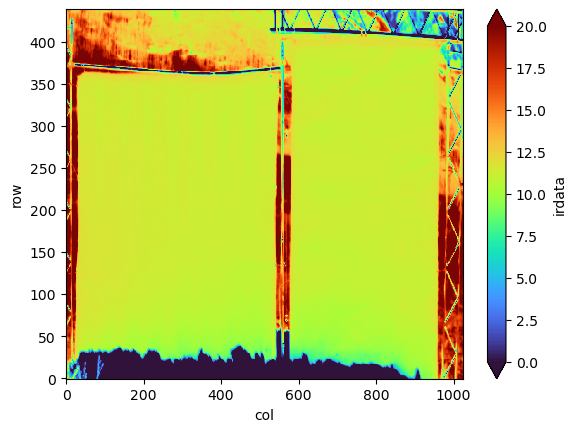

In [9]:
ds_mean_cropped.plot(vmin=0,vmax=20, cmap='turbo')

Grab a subset of the data so col starts at and ends at the left and right boundaries of the two sheets.

In [10]:
# this removes the left most edge
ds_mean_cropped = ds_mean_cropped.sel(col=slice(30,1024))

# this removes the right most edge
ds_mean_cropped = ds_mean_cropped.sel(col=slice(0, 929))

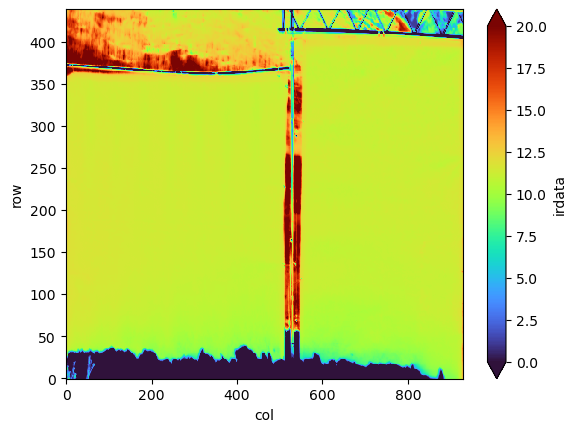

In [11]:
ds_mean_cropped.plot(vmin=0,vmax=20, cmap='turbo')

Now let's cut off the top

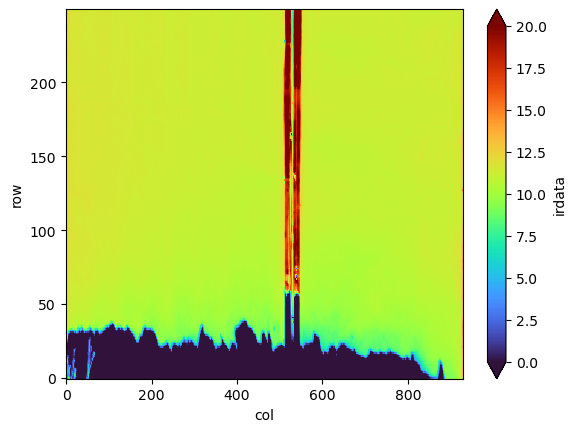

In [12]:
ds_mean_cropped.sel(
    row = slice(0,250)
).plot(vmin=0,vmax=20, cmap='turbo')

In [13]:
ds_mean_cropped = ds_mean_cropped.sel(
    row = slice(0,350)
)

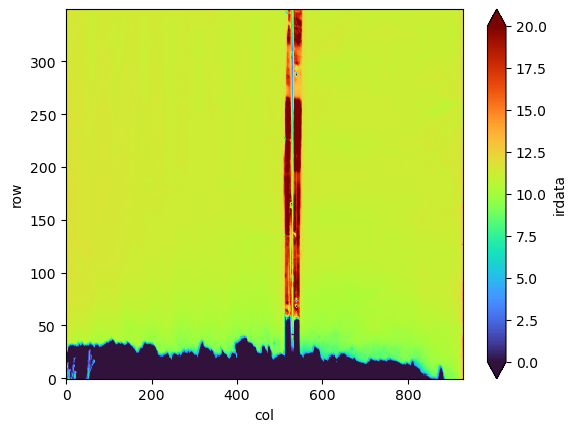

In [14]:
ds_mean_cropped.plot(vmin=0,vmax=20, cmap='turbo')

# Find the snow-surface and set values below to 0

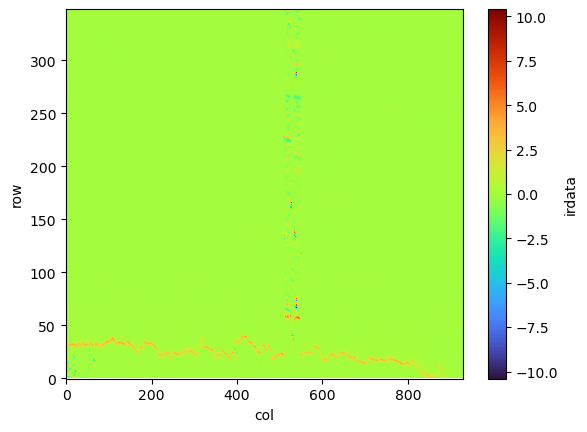

In [15]:
ds_mean_cropped.diff(dim='row').rolling(row=2).median().plot(cmap='turbo')

In [16]:
import matplotlib.pyplot as plt

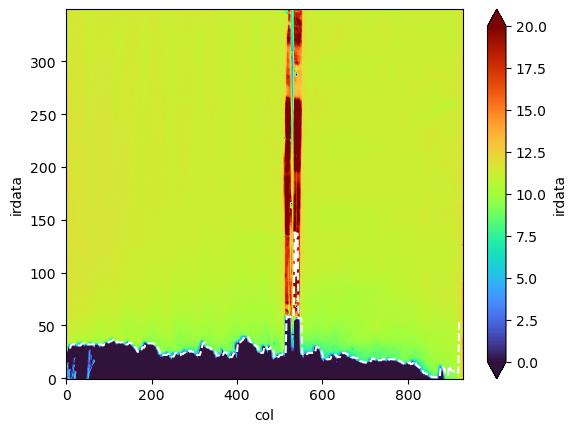

In [17]:
# Get the row index of the maximum value for each column
max_indices = ds_mean_cropped.diff(dim='row').rolling(row=2).median().argmax(dim="row", skipna=True)

ds_mean_cropped.plot(vmin=0,vmax=20, cmap='turbo')
max_indices.rolling(col=10).median().plot(color='white', linestyle='--')
# plt.ylim(0,100)

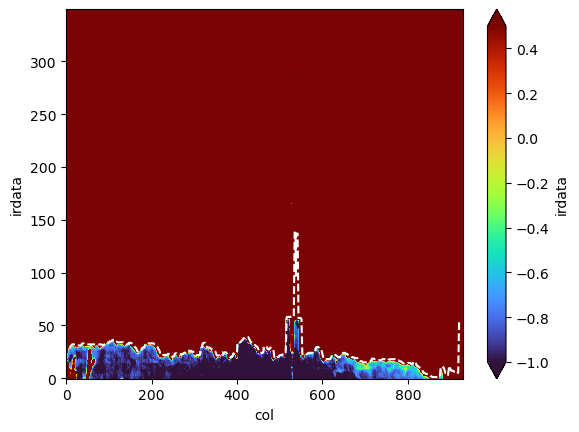

In [18]:

# Get the row index of the maximum value for each column
max_indices = ds_mean_cropped.diff(dim='row').rolling(row=2).median().argmax(dim="row", skipna=True)

ds_mean_cropped.plot(vmin=-1,vmax=0.5, cmap='turbo')
max_indices.rolling(col=10).median().plot(color='white', linestyle='--')
# plt.ylim(0,100)

In [19]:
max_indices = max_indices.rolling(col=10).median()

(array([5.0000e+00, 1.2000e+01, 1.5000e+01, 2.8000e+01, 6.5000e+01,
        1.2550e+03, 1.1033e+04, 5.2640e+03, 1.3900e+03, 5.4100e+02,
        2.4600e+02, 1.7700e+02, 1.5300e+02, 1.5800e+02, 1.3400e+02,
        1.2500e+02, 1.1900e+02, 1.2800e+02, 1.0300e+02, 1.0700e+02,
        8.5000e+01, 7.8000e+01, 8.2000e+01, 7.7000e+01, 7.1000e+01,
        7.3000e+01, 8.0000e+01, 6.2000e+01, 6.6000e+01, 5.3000e+01,
        6.7000e+01, 6.5000e+01, 6.4000e+01, 5.8000e+01, 5.1000e+01,
        5.8000e+01, 4.6000e+01, 4.6000e+01, 5.4000e+01, 4.7000e+01,
        4.9000e+01, 4.4000e+01, 5.7000e+01, 4.9000e+01, 6.5000e+01,
        1.1600e+02, 1.0000e+02, 5.5000e+01, 3.8000e+01, 3.3000e+01,
        3.8000e+01, 9.1000e+01, 2.2000e+02, 5.7000e+01, 1.9000e+01,
        1.4000e+01, 1.7000e+01, 2.2000e+01, 2.8000e+01, 2.0000e+01,
        2.5000e+01, 1.6000e+01, 1.5000e+01, 1.5000e+01, 1.3000e+01,
        9.0000e+00, 6.0000e+00, 1.2000e+01, 3.0000e+00, 1.0000e+01,
        8.0000e+00, 1.1000e+01, 8.0000e+00, 9.00

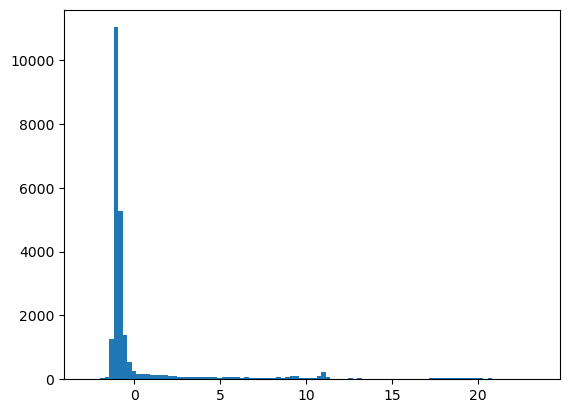

In [20]:
ds_mean_cropped_to_snow = ds_mean_cropped.where(ds_mean_cropped.row <= max_indices, other=np.nan)
plt.hist(ds_mean_cropped_to_snow.values.flatten(), bins=100)

In [21]:
ds_mean_cropped = ds_mean_cropped.where(ds_mean_cropped.row > max_indices, other=np.nan)

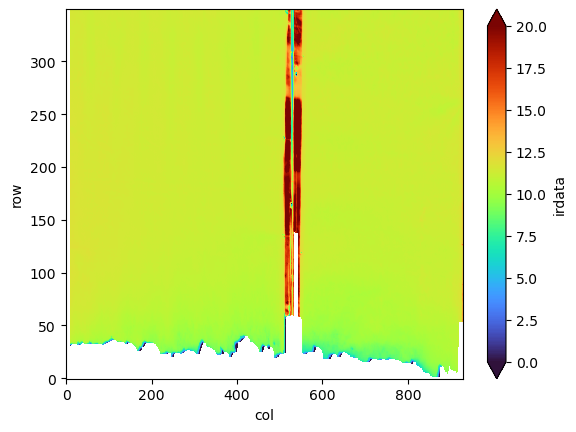

In [22]:
ds_mean_cropped.plot(vmin=0,vmax=20, cmap='turbo')

Remove the data in between the two sheets

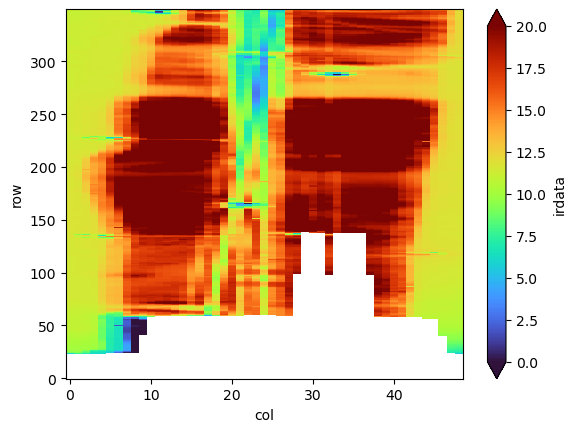

In [23]:
ds_mean_cropped.sel(
    col = slice(506,555)
).plot(vmin=0,vmax=20, cmap='turbo')

In [24]:
ds_mean_cropped = ds_mean_cropped.where(
    (ds_mean_cropped.col < 508)
    | (ds_mean_cropped.col > 555)
)

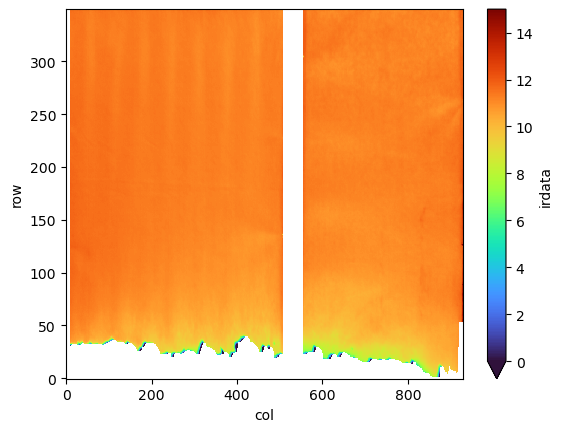

In [25]:
ds_mean_cropped.plot(vmin=0,vmax=15, cmap='turbo')

Convert the row and column indices to meters

Length relations: 
* the fixation of the left horizontal bar at the leftmost vertical bar is at 1.90m above the (bare) surface. 
* The left horizontal bar from vertical post to vertical post is 2.92m long. 
* The right horizontal bar from vertical post to vertical post is 2.06m. The bottom of the right horizontal bar is 2.26m above bare ground at the middle vertical post. Sorry, a lot of numbers...

i.e...
* total width of the col dimension, i.e. from the left edge of left sheet to right edge of right sheet is: 2.06 + 2.92 = **4.98 meters**
* total height of the row dimension, i.e. from where the pole meets the ground to the top support pole, is **1.9 meters**

In [26]:
TOTAL_WIDTH = 4.98
TOTAL_HEIGHT = 1.9

## FOR THE GRIDDED DATA
# create coords x and why, scaling the col and row dimensions using the dimensions of the observations/sheets
ds_mean_cropped = ds_mean_cropped.assign_coords(
    x = TOTAL_WIDTH * ds_mean_cropped.col / len(ds_mean_cropped.col),
    z = TOTAL_HEIGHT * ds_mean_cropped.row / len(ds_mean_cropped.row)
)

# replace the dims with the physical ones
ds_mean_cropped = ds_mean_cropped.to_dataframe().reset_index(drop=True).set_index(['x', 'z']).to_xarray().irdata.T

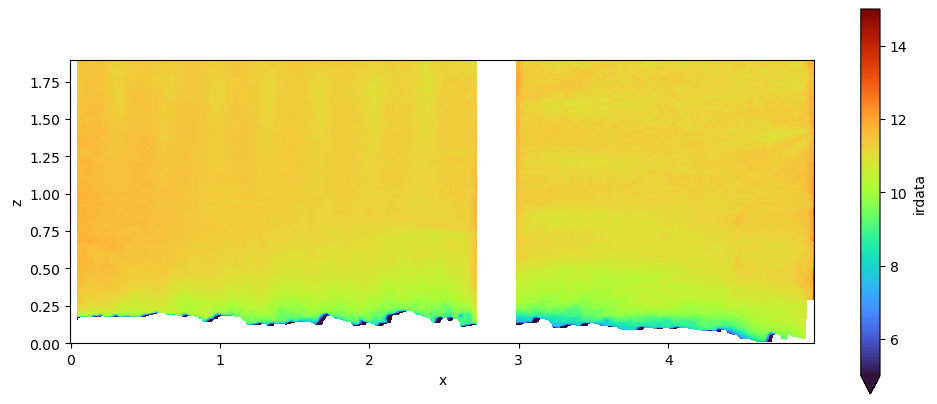

In [27]:
plt.figure(figsize=(12,5))
ds_mean_cropped.plot(vmin=5,vmax=15, cmap='turbo')
plt.gca().set_aspect('equal')

### Apply Gaussian Smoothing Filter

In [28]:
# from scipy.ndimage import gaussian_filter

# sigma = 3

# # Apply the gaussian_filter from SciPy to the DataArray using .apply()
# # `keep_attrs=True` will retain the original metadata.
# smoothed_da = xr.apply_ufunc(
#     gaussian_filter,
#     ds_1frame_cropped,
#     input_core_dims=[['z', 'x']],
#     output_core_dims=[['z', 'x']],
#     kwargs={'sigma': sigma},
#     dask='parallelized', # Use Dask for parallel computation on large arrays
#     output_dtypes=[ds_1frame_cropped.dtype],
#     keep_attrs=True,
#     dask_gufunc_kwargs={'allow_rechunk': True}
# )

In [29]:
# smoothed_da.plot(vmin=0,vmax=15, cmap='turbo')
# plt.gca().set_aspect('equal')

In [30]:
# ds_1frame_cropped = smoothed_da

Extract Profiles at 50cm intervals, use 10cm width, 2cm height, bins to get values

In [31]:
np.diff(ds_mean_cropped.z.values).min(), np.diff(ds_mean_cropped.z.values).max()

(0.005428571428571338, 0.005428571428571782)

In [32]:
# get a dataframe for easy processing
df = ds_mean_cropped.to_dataframe().reset_index()

# bin the z values into 1cm bins
df = df.assign(
    z = pd.cut(
        df['z'], 
        # np.linspace(-0.02,2,102)
        np.arange(-0.01,2.01,0.01)
    ).apply(
        lambda interval: interval.right
    )
)

Combine the datasets. Also, reindex into a higher resolution so that we can manipulate the data later.

In [33]:
z_high_res = np.linspace(0, 2, num=2001)  # Adjust num for desired resolution
z_high_res

array([0.000e+00, 1.000e-03, 2.000e-03, ..., 1.998e+00, 1.999e+00,
       2.000e+00])

Where should we extract profiles? Let's not go beyond x=4, because the way we had to crop the data makes it so there is no snow at the bottom beyond x=4. What about x=0?

In [34]:
ds_mean_cropped.z.diff('x')

<xarray.DataArray 'z' (z: 350)> Size: 3kB
array([0.      , 0.005429, 0.010857, ..., 1.883714, 1.889143, 1.894571])
Coordinates:
  * z        (z) float64 3kB 0.0 0.005429 0.01086 0.01629 ... 1.884 1.889 1.895

In [35]:
import rioxarray as rix
ds_mean_cropped.z.diff('z')

<xarray.DataArray 'z' (z: 349)> Size: 3kB
array([0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
...
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857, 0.00542857,
       0.00542857, 0.00542857, 0.00542857, 0.00542857])
Coordinates:
  * z        (z) float64 3kB 0.005429 0.01086 0.01629 ... 1.884 1.889 1.895

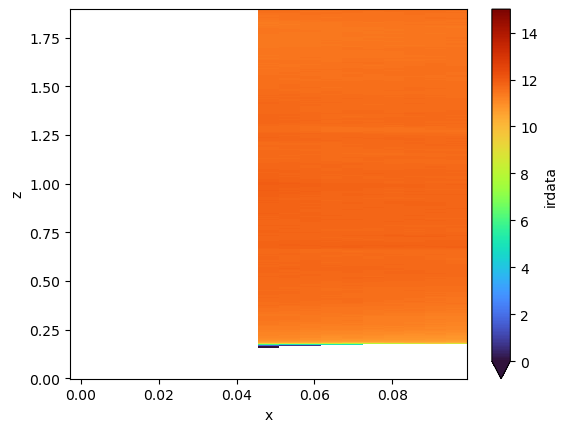

In [36]:
ds_mean_cropped.sel(x=slice(0,0.10)).plot(vmin=0,vmax=15, cmap='turbo')

We see that data is noisy - let's extract data every 25cm, but make our first data point at 0.01

In [37]:
X = np.linspace(0.25, 4.5, 18)
X = [0.08] + list(X) # Perhaps our best value for upwind conditions
X

[0.08,
 0.25,
 0.5,
 0.75,
 1.0,
 1.25,
 1.5,
 1.75,
 2.0,
 2.25,
 2.5,
 2.75,
 3.0,
 3.25,
 3.5,
 3.75,
 4.0,
 4.25,
 4.5]

In [38]:
z_high_res

array([0.000e+00, 1.000e-03, 2.000e-03, ..., 1.998e+00, 1.999e+00,
       2.000e+00])

In [39]:
df_profiles = pd.DataFrame()
for val in X:
    profile = df.query(
            f"x > {val - 0.02}"
        ).query(
            f"x < {val + 0.02}"
        ).groupby('z', observed=True)[
            ['irdata']
        ].mean(
            
        ).assign(
            x = val
        ).reindex(
            z_high_res
        ).interpolate(
            method='linear',
            limit=10
        )
    df_profiles = pd.concat([df_profiles,profile])

In [40]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [41]:
alt.Chart(
    df_profiles.reset_index()
).mark_line().encode(
    alt.X('irdata:Q'),
    alt.Y('z:Q'),
    alt.Color('x:O'),
    order='z:Q',
    tooltip='x'
).properties(width = 300, height = 300) |\
alt.Chart(
    df_profiles.reset_index().query("z < 0.6")
).mark_line().encode(
    alt.X('irdata:Q'),
    alt.Y('z:Q'),
    alt.Color('x:O'),
    # alt.Facet('x:O', columns=4),
    order='z:Q',
    tooltip='x'
).properties(width = 300, height = 300)

alt.HConcatChart(...)

I need to adjust the profiles for the variable snow surface. 

Steps:
1. (Optional) Interpolate along the lines to get a higher resolution dataset
2. Find z value where irdata = 0 - actually, it looks like things will work better if I use irdata = 2?
3. Adjust z values for that profile

In [42]:
adjusted_df_list = []
for val in X:
    src = df_profiles.query(f"x == {val}")
    src = src.assign(irdata = src.irdata.round(2))
    idx = src['irdata'][::-1].idxmin()
    print(idx)
    src.index = np.round(src.index - idx + 0, 3)
    adjusted_df_list.append(src)
df_adjusted = pd.concat(adjusted_df_list)

0.18
0.18
0.18
0.18
0.17
0.13
0.14
0.17
0.14
0.22
0.16
nan
0.13
0.11
0.14
0.09
0.1
0.09
0.03


/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_8662/1754449667.py:5: FutureWarning: The behavior of Series.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  idx = src['irdata'][::-1].idxmin()


In [43]:
alt.Chart(
    df_adjusted.reset_index().query("z < 0.14")
).mark_line().encode(
    alt.X('irdata:Q'),
    alt.Y('z:Q'),
    alt.Color('x:O'),
    # alt.Facet('x:O', columns=4),
    order='z:Q',
    tooltip='x'
).properties(width = 300, height = 300) | alt.Chart(
    df_adjusted.reset_index()
).mark_line().encode(
    alt.X('irdata:Q').title('T (˚C)'),
    alt.Y('z:Q').title('Height (m)'),
    alt.Color('x:O').scale(scheme='rainbow'),
    order='z:Q',
    tooltip='x'
).properties(width = 500, height = 500)

alt.HConcatChart(...)

Set the internal boundary layer depth - above that height, we will not calculate advected energy

We manually select this based on the "blending height" we observe above

In [44]:
MAX_INTEGRATION_DEPTH = 0.6

Reindex all the temp profiles to be on the same index

In [45]:
xxxxx =  df_adjusted[df_adjusted.index > 0]

In [46]:
# find the extracted profile with the shortest extracted data 
lowest_data = xxxxx.reset_index().groupby("x").z.max().min()
lowest_data

1.66

In [47]:
z_common_index = np.arange(0, lowest_data, 0.001)
z_common_index

array([0.000e+00, 1.000e-03, 2.000e-03, ..., 1.657e+00, 1.658e+00,
       1.659e+00])

In [48]:
df_adjusted = xxxxx.groupby('x').apply(lambda df: df.reindex(z_common_index, method='nearest')).droplevel(0)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_8662/613429446.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_adjusted = xxxxx.groupby('x').apply(lambda df: df.reindex(z_common_index, method='nearest')).droplevel(0)


In [49]:
alt.Chart(
    df_adjusted.reset_index().query("z < 0.2")
).mark_line(point=True).encode(
    alt.X('irdata:Q'),
    alt.Y('z:Q'),
    alt.Color('x:O'),
    # alt.Facet('x:O', columns=4),
    order='z:Q',
    tooltip='x'
).properties(width = 600, height = 600) | alt.Chart(
    df_adjusted.reset_index()
).mark_line().encode(
    alt.X('irdata:Q').title('T (˚C)'),
    alt.Y('z:Q').title('Height (m)'),
    alt.Color('x:O').scale(scheme='rainbow'),
    order='z:Q',
    tooltip='x'
).properties(width = 500, height = 500)

alt.HConcatChart(...)

# Calculate sensible heat flux into snow

Open sos data 

In [50]:
sos_tidy_fn = f"../../paper1/process_slow_data/tidy_df_20221101_20230619_planar_fit_multiplane_q7_flags9000_pf10.parquet"
sos_df = pd.read_parquet(sos_tidy_fn)
sos_df['time'] = pd.to_datetime(sos_df['time'])
sos_df = utils.modify_df_timezone(sos_df, 'UTC', 'US/Mountain')

In [51]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [52]:
alt.Chart(
    sos_df[sos_df.measurement  == 'w'].set_index(
        'time'
    ).sort_index().loc['20230509':'20230522'].reset_index().query("height >= 1")
).transform_window(
    rolling_avg = 'mean(value)',
    frame=[-3,3],
    groupby=['tower','height']
).mark_line().encode(
    alt.X('time:T'),
    alt.Y('rolling_avg:Q'),
    alt.Facet('tower:N', columns=1),
    alt.Color('height:N')
).resolve_scale(y='independent').properties(width=1000, height=150)


alt.Chart(...)

In [53]:
alt.Chart(
    sos_df[sos_df.measurement  == 'w'].set_index(
        'time'
    ).sort_index().loc['20230509':'20230522'].reset_index().query("height == 3"),
).transform_window(
    rolling_avg = 'mean(value)',
    frame=[-3,3],
    groupby=['tower','height']
).mark_line().encode(
    alt.X('time:T'),
    alt.Y('rolling_avg:Q'),
    alt.Color('tower:N')
).resolve_scale(y='independent').properties(width=1000, height=150)


alt.Chart(...)

In [54]:
alt.Chart(
    sos_df[sos_df.variable.isin(
        ['w_tc__3m_c', 'w_tc__3m_d', 'w_tc__3m_ue', 'w_tc__3m_c',
         'spd_3m_c', 'spd_3m_d', 'spd_3m_ue', 'spd_3m_uw']
    )].set_index(
    'time'
).loc['20230517'].reset_index()
).mark_line().encode(
    alt.X('time:T'),
    alt.Y('value:Q'),
    alt.Column('measurement'),
    alt.Color('tower:N')
).resolve_scale(y='independent').properties(width=300, height=150)


alt.Chart(...)

$$ < H_O > = H_u + Q_a $$

where $H_u$ is the heat flux upwind of the snow-patch, $Q_a$ is the advected energy. 

$$ Q_a = \frac{\Delta S}{X_s} $$

$\Delta$ S is the *difference in horizontal transport of heat* between the upwind and downwind edges of the snow-patch, and $X$ is the length of the snow-patch.

$$ Q_a = \frac{\Delta S}{X_s} = \frac{\rho c_p}{X_s} \int^B_0 U(z)  \Big(T(z)_u - T(z)_s \Big) dz $$

We will assume the following for $U(z)$

$$ U(z) = \frac{u_*}{k} \text{ln} \frac{z}{z_0} $$

In [55]:
sos_data_moment = sos_df.set_index('time').loc['20230517 1200']

Prep parameters, Solve for z0

$$ z_0 = z \text{exp} \Big[ - \frac{k}{u_*} U(z) \Big]$$

In [57]:
def get_U(z, u_star, z_0):
    return (u_star.magnitude/k)*np.log(z / z_0.magnitude)

In [81]:
c_p = 1000.5 * units('joules/(K*kg)')
rho_a = 1 * units("kg/m^3")

H_u = (sos_df.query("variable == 'w_tc__3m_c'").set_index('time').loc['20230517 1200'].value * units(
    "kelvin * m/s"
) * c_p * rho_a).to(units("W/m^2"))
# Make it negative to conform with Essery et al's convention
H_u = - H_u
print('H_u:\t', H_u)

z = 2 * units("meters")
u_star = sos_data_moment.query("variable == 'u*_2m_c'").value.iloc[0] * units("m/s")
U = sos_data_moment.query("variable == 'spd_2m_c'").value.iloc[0] * units("m/s")
k = 0.41 

z_0 = z * np.exp(
    - (k / u_star) * U
)
# z_0 = 0.03 * units("meters")    # flat ground with few isolated obstacles
# z_0 = 0.005 * units("meters")   # mud flats
print('z_0:\t', z_0)



U_df = df_adjusted.query("x == 0.5").reset_index().query("z > 0").drop(
    columns=['irdata', 'x']
)
U_df['U'] = U_df['z'].apply(lambda z: get_U(z, u_star, z_0))
U_df = U_df.query(f"z > {z_0.magnitude}")
U_df.loc[0] = 0
U_df = U_df.set_index('z').sort_index()
U_df.head()

H_u:	 -142.7648905451177 watt / meter ** 2
z_0:	 0.007999229724652399 meter


,U
z,
0.000,0.000000
0.008,0.000059
0.009,0.071714
0.010,0.135813
0.011,0.193797


Calculate $Q_a$ for a different distnaces into the snow patch that we extracted temp profile data for.

$$ Q_a = \frac{\Delta S}{X_s} = \frac{\rho c_p}{X_s} \int^B_0 U(z)  \Big(T(z)_u - T(z)_s \Big) dz $$

In [82]:
H_0_df = pd.DataFrame(columns=['X', 'Q_a'])

advection_df = df_adjusted[
    df_adjusted.index < MAX_INTEGRATION_DEPTH
].join(U_df).dropna()

Q_a_ls=[]
for val in X:
    T_u = advection_df.query(f"x == 0.08")[['irdata', 'U']]
    T_s = advection_df.query(f"x == {val}")[['irdata', 'U']]
    T_combined = T_u.rename(columns={'irdata':'T_u'}).join(
        T_s.rename(columns={'irdata':'T_s'})[['T_s']]
    ).dropna()
    T_diff_values = (T_combined['T_u'] - T_combined['T_s']).values * units("kelvin")
    U_values = T_combined['U'].values * units("m/s")
    argument = ( U_values * T_diff_values )
    domain = T_combined.index.values * units("m")
    # Sometimes, T profiles have nans in them, and trapz returns zero when you operate on missing data
    if len(argument.magnitude) == 0:
        Q_a = np.nan * units("W/m^2")

        Q_a_ls.append(np.nan)

    else:
        Q_a = (c_p * rho_a * np.trapz(argument, domain) / (val * units("m"))).to(units("W/m^2"))

        
        Q_a_ls.append(Q_a.magnitude)

H_0_df = pd.DataFrame({
    'X':X,
    'Q_a': Q_a_ls,
})
# add a value for zero advected heat at x=0
H_0_df = pd.concat([
    H_0_df,
    pd.DataFrame({'X': [0], 'Q_a': [0]})
]).set_index('X')


In [83]:
H_0_df['H_u'] = H_u.magnitude
H_0_df['H_0'] = H_0_df['H_u'] + H_0_df['Q_a']

In [84]:
measured_H_0_chart = alt.Chart(
    H_0_df.reset_index().assign(type='Measured')
).mark_point(size=50, filled=True, color='black').encode(
    alt.X('X:Q'),
    alt.Y('H_0:Q'),
    alt.Shape('type').title(None).scale(range=['circle']),
    tooltip='H_0:Q',
).properties(width=400, height=200)
measured_H_0_chart

alt.Chart(...)

In [ ]:
from scipy.optimize import curve_fit

def q_a_power_law(a,b,X):
    return a*X**b

# Fit the function to the data
def fit_power_law(X, Q_a):
    # Initial guess for parameters a and b
    initial_guess = [1, 1]
    # Use curve_fit to find the best-fit parameters
    params, covariance = curve_fit(lambda X, a, b: q_a_power_law(a, b, X), X, Q_a, p0=initial_guess)
    return params

fitting_data_df = H_0_df.sort_index().iloc[2:].dropna()
fitting_data_df_lessdata = H_0_df.sort_index().iloc[4:].dropna()

# Perform the fitting
a, b = fit_power_law(fitting_data_df.index,fitting_data_df['Q_a'])
a_lessdata, b_lessdata = fit_power_law(fitting_data_df_lessdata.index,fitting_data_df_lessdata['Q_a'])

# Generate the fitted curve
X_fitted = np.linspace(fitting_data_df.index.min(), 10, 100)
Q_a_fitted = q_a_power_law(a, b, X_fitted)
Q_a_fitted_lessdata = q_a_power_law(a_lessdata, b_lessdata, X_fitted)

# Plot the data and the fitted curve
plt.figure(figsize=(8, 6))
plt.scatter(fitting_data_df.index, fitting_data_df['Q_a'], color='tab:blue', label='Data')
plt.scatter(fitting_data_df_lessdata.index, fitting_data_df_lessdata['Q_a'], color='tab:orange', label='Data')
plt.plot(X_fitted, Q_a_fitted, color='tab:blue', label=f"fit all data: a={round(a)}, b={round(b,2)}")
plt.plot(X_fitted, Q_a_fitted_lessdata, color='tab:orange', label=f"fit, early points removed: a={round(a_lessdata)}, b={round(b_lessdata,2)}")
plt.xlabel('X')
plt.ylabel('Q_a')
plt.title('Data and Fitted Power-Law Curve')
plt.legend()
plt.grid(True)
plt.show()


# Model - Following Essery et al., 2002, Equation 22

## Outline

In [ ]:
a = 4.74*units("dimensionless")

def E(z, z_b, z_0):
    argument = lambda z: (1 + (a*z)/z_b)*np.exp( - (a*z)/(z_b))*(1 / (z + z_0))
    integral, _ = scipy.integrate.quad(argument, 0, z)  # Integrate argument from 0 to z
    return integral 

In [ ]:
H_u = None      # Heat flux in the constant flux layer above the (upwind) bare ground
u_star = None   # shear velocity in the constant flux layer above the (upwind) bare ground
z_b = None      # depth of the internal boundary layer at given x
z_0 = None      # roughness height
T_b = None      # Temperature at top of boundary layer
T_0 = None      # Temperature snow surface

rho = 1 * units("kg/m^3")
c_p = 1000.5 * units('joules/(K*kg)')
k = 0.41 * units("dimensionless")

In [ ]:
df_adjusted_smoothed = df_adjusted.groupby('x').apply(lambda df: df.rolling(20, min_periods=1).mean()).droplevel(0)
alt.Chart(
    df_adjusted.reset_index()
).mark_line().encode(
    alt.X('irdata:Q').title('T (˚C)'),
    alt.Y('z:Q').title('Height (m)'),
    alt.Color('x:O').scale(scheme='rainbow'),
    order='z:Q',
    tooltip='x'
).properties(width = 400, height = 400) | alt.Chart(
    df_adjusted_smoothed.reset_index()
).mark_line().encode(
    alt.X('irdata:Q').title('T (˚C)'),
    alt.Y('z:Q').title('Height (m)'),
    alt.Color('x:O').scale(scheme='rainbow'),
    order='z:Q',
    tooltip='x'
).properties(width = 400, height = 400)



In [ ]:
# Use measured H_u and u*
H_u = (sos_data_moment.query("variable == 'w_tc__3m_c'").value.iloc[0] * units("kelvin * m/s") * rho * c_p).to(units("W/m^2"))
# Make it negative to conform with Essery et al's convention
H_u = - H_u
u_star = sos_data_moment.query("variable == 'u*_2m_c'").value.iloc[0] * units("m/s")
print(H_u)
print(u_star)

# estimate z_0
z = 2 * units("meters")
U = sos_data_moment.query("variable == 'spd_2m_c'").value.iloc[0] * units("m/s")
z_0 = z * np.exp( - (k / u_star) * U )
print(z_0)

# Estimate T_b from the measurements plotted above
# T_b_distribution = df_adjusted.query("x < 3").query("z == 1.0").irdata
# T_b = T_b_distribution.mean() * units("degC")
# T_b = sos_data_moment.query("variable == 'T_1m_c'").value.iloc[0] * units("degC")
T_b = 10.5 * units("degC")
print(T_b)

# Estimate T_0 as 0
T_0 = 0 * units("degC")
print(T_0)

In [ ]:
sos_data_moment.query("variable == 'T_3m_c'").value.iloc[0], sos_data_moment.query("variable == 'T_2m_c'").value.iloc[0], sos_data_moment.query("variable == 'T_1m_c'").value.iloc[0] 

From Essery et al., 2002,

$$ 
H_0(x) = H_u - \frac{1}{E(z_b)} \Bigg[ 
        H_u \text{ln} \Big( \frac{z_b + z_0}{z_0} \Big)
        + \rho c_p k u_* (T_b - T_0)
    \Bigg]
$$

$$
Q_a = \frac{1}{E(z_b)} \Bigg[ 
        H_u \text{ln} \Big( \frac{z_b + z_0}{z_0} \Big)
        + \rho c_p k u_* (T_b - T_0)
    \Bigg]
$$

We decompose this into turbulent flux and the advected flux

$$ H_0(x) = H_u - Q_a $$ 

where $Q_a$ is defined by the second term above.

Note that $Q_a$ is not directly a function of $x$, but is implicitly, do to it's being a function of $z_b$.

In [ ]:
H_u

In [ ]:
np.log((0.5+0.002) / 0.002), np.log((1+0.002) / 0.002)

In [ ]:
E(0.5, 0.5, 0.002), E(1, 1, 0.002)

In [ ]:
T_b, T_0

In [ ]:
def Q_a(z_b):
    return - (
        1 / E(z_b.magnitude, z_b.magnitude, z_0.magnitude)
    )*(
        H_u * np.log((z_b+z_0)/z_0) + rho*c_p*k*u_star*(T_b - T_0)
    )

Note that Q_a does not actually rely on x directly above, but it does rely on x through z_b, which is a function of x. The z_b value we chose was for x= 2.5, per the plot above. But we can do better - let's... 

**Fit z_b(x) to our data**

note that we use the upwind profile at x == 0.08

In [ ]:
df_adjusted.x.min()

In [ ]:
T_profiles = df_adjusted_smoothed[df_adjusted_smoothed.index >= 0].query("x != 0.08").rename(
    columns={'irdata': 'T'}
)
T_profile_upwind = df_adjusted_smoothed[df_adjusted_smoothed.index >= 0].query("x == 0.08")
T_profiles_merged = T_profiles.join(
    T_profile_upwind['irdata'].rename('T_upwind')
).dropna()
T_profiles_merged['T_diff'] = T_profiles_merged['T_upwind'] - T_profiles_merged['T'] 
T_profiles_merged

In [ ]:
alt.Chart(T_profiles_merged.reset_index()).mark_line().encode(
    alt.X('T_diff:Q'),
    alt.Y('z:Q'),
    alt.Color('x:N'),
    order='z'
) | alt.Chart(T_profiles_merged.reset_index().query("z < 1.0")).mark_line().encode(
    alt.X('T_diff:Q').scale(domain=[-1,3], clamp=True),
    alt.Y('z:Q'),
    alt.Color('x:N'),
    order='z'
)

In [ ]:
# we only look above 0.3 to get rid of temps close to the surface
z_b_df = pd.DataFrame(
    T_profiles_merged.query("T_diff < 0.1").reset_index().query("z > 0.3").groupby('x').z.min()
)
alt.Chart(z_b_df.reset_index()).mark_point().encode(
    alt.X('x:Q').scale(type='linear'), 
    alt.Y('z:Q').scale(type='linear')
) | alt.Chart(z_b_df.reset_index()).mark_point().encode(
    alt.X('x:Q').scale(type='log'), 
    alt.Y('z:Q').scale(type='log')
)

In [ ]:
def ibl_height(X, c, b):
    return c*X**b
X = z_b_df.index
Y = z_b_df.z

# Fit the ibl_height function to the data
popt, pcov = curve_fit(ibl_height, X, Y, p0=[0.18, 0.62], bounds=([0, 0], [1, 1]))  # Initial guesses for c and b

# Extract fitted parameters
c_fit, b_fit = popt
print(f"Fitted parameters: c={c_fit}, b={b_fit}")

# Generate fitted curve
X_fit = np.linspace(0, max(X), 100)
Y_fit = ibl_height(X_fit, c_fit, b_fit)
Y_fit_from_literature = ibl_height(X_fit, 0.18, 0.62) # from: grangerBoundarylayerGrowthSnow2006

# Plot the original data and the fitted curve
plt.scatter(X, Y, label="Data", color="blue")
plt.plot(X_fit, Y_fit, label="Fitted Curve", color="red")
plt.plot(X_fit, Y_fit_from_literature, label="Curve from Essery et al., 2006", color="red", alpha=0.25)
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.title("Fit of IBL height function, from Essery et al., 2006")
plt.show()

In [ ]:
plt.figure(figsize=(12,5))
ds_mean_cropped.plot(vmin=5,vmax=15, cmap='turbo')
plt.gca().set_aspect('equal')

X_fit = np.linspace(0, max(X), 100)
Y_fit = ibl_height(X_fit, c_fit, b_fit)
Y_fit_from_literature = ibl_height(X_fit, 0.18, 0.62) # from: grangerBoundarylayerGrowthSnow2006

# Plot the original data and the fitted curve
plt.plot(X_fit, 0.2+Y_fit_from_literature, label="Essery et al., 2006", color="red", alpha=0.5,)
plt.plot(X_fit, 0.2+Y_fit, label="Fitted curve", color="red", alpha=0.5, linestyle='--')
plt.legend()

In [ ]:
plt.figure(figsize=(12,5))
ds_mean_cropped.plot(vmin=5,vmax=14.5, cmap='turbo')
plt.gca().set_aspect('equal')

X_fit = np.linspace(0, max(X), 100)
Y_fit = ibl_height(X_fit, c_fit, b_fit)
Y_fit_from_literature = ibl_height(X_fit, 0.18, 0.62) # from: grangerBoundarylayerGrowthSnow2006

plt.plot(X_fit, 0.2+Y_fit_from_literature, label="Essery et al., 2006", color="red", alpha=0.5)

In [ ]:
T_at_zb = []
for x, y in zip(X_fit, Y_fit_from_literature):
    T_at_zb.append(ds_mean_cropped.interp(x=x, z=y).values)

In [ ]:
pd.DataFrame(T_at_zb).plot.hist()

In [ ]:
plt.figure(figsize=(12,5))
(
    ds_mean_cropped - ds_mean_cropped.isel(x=slice(10,20)).mean(dim='x')
).plot(vmin=-2,vmax=2, cmap='RdYlBu_r')
plt.gca().set_aspect('equal')

X_fit = np.linspace(0, max(X), 100)
Y_fit = ibl_height(X_fit, c_fit, b_fit)
Y_fit_from_literature = ibl_height(X_fit, 0.18, 0.62) # from: grangerBoundarylayerGrowthSnow2006

# Plot the original data and the fitted curve
plt.plot(X_fit, 0.2+Y_fit_from_literature, label="Curve from Essery et al., 2006", color="red", alpha=0.25)
plt.plot(X_fit, 0.2+Y_fit, label="Curve from Essery et al., 2006", color="red", alpha=0.25)

In [ ]:
# def fitted_ibl_height(X, c=c_fit, b=b_fit):
# def fitted_ibl_height(X, c=0.135, b=0.6): # not sure where i got his...maybe my by eye fit?
def fitted_ibl_height(X, c=0.18, b=0.62): #granger et al. 2002, z0 = 0.002 - 0.005
# def fitted_ibl_height(X, c=0.30, b=0.62):
# def fitted_ibl_height(X, c=0.23, b=0.58): #granger et al. 2002, z0 = 0.02 - 0.04
# def fitted_ibl_height(X, c=0.64, b=0.5):  #granger et al. 2002, z0 = 0.08 - 0.12
    return c*X**b

Now calculate Q_a for each X value, using the fitted z_b function

IS THIS WRONG? SHOULD IT BE + Q_a?

In [ ]:
model_results = pd.DataFrame({
    'x': np.linspace(0.1,10,100),
    'Q_a': [(
        (Q_a(fitted_ibl_height(X, c=0.18, b=0.62) * units("m"))).round()
    ).magnitude for X in np.linspace(0.1,10,100)],
    'H_0': [(
        (H_u - Q_a(fitted_ibl_height(X, c=0.18, b=0.62) * units("m"))).round()
    ).magnitude for X in np.linspace(0.1,10,100)],
})
model_results['<H_0>'] = model_results['H_0'].expanding().mean()

In [ ]:
H_0_of_x_chart = alt.Chart(model_results.assign(type='Modeled')).mark_line().encode(
    alt.X('x:Q').title('Snow patch length (m)'),
    alt.Y('<H_0>:Q').title(['〈H₀〉= Avg. heat flux', 'into snow patch (W m⁻²)']),
    alt.Color('type').title(None)
)
(H_0_of_x_chart + measured_H_0_chart).configure_legend(
    orient='top-right',
    fillColor='white',
    padding=15,
    labelFontSize=12
)

In [ ]:
fit_df = pd.DataFrame([X_fitted, Q_a_fitted + H_u.magnitude]).T
fit_df.columns = ['X', '<H_0>']
fit_df_lessdata = pd.DataFrame([X_fitted, Q_a_fitted_lessdata + H_u.magnitude]).T
fit_df_lessdata.columns = ['X', '<H_0>']

H_0_powerlaw_fit_chart = alt.Chart(fit_df.assign(type='power law fit, all data')).mark_line().encode(
    alt.X('X:Q').title('Snow patch length (m)'),
    alt.Y('<H_0>:Q').title(['〈H₀〉= Avg. heat flux', 'into snow patch (W m⁻²)']),
    alt.Color('type').title(None)
)
H_0_powerlaw_fit_lessdata_chart = alt.Chart(fit_df_lessdata.assign(type='power law fit, exluding data 0-1m')).mark_line().encode(
    alt.X('X:Q').title('Snow patch length (m)'),
    alt.Y('<H_0>:Q').title(['〈H₀〉= Avg. heat flux', 'into snow patch (W m⁻²)']),
    alt.Color('type').title(None)
)
(H_0_powerlaw_fit_chart + H_0_powerlaw_fit_lessdata_chart + measured_H_0_chart).configure_legend(
    orient='top-right',
    fillColor='white',
    padding=15,
    labelFontSize=12
).properties(width=400, height=300)

In [ ]:
model_results = pd.DataFrame({
    'x': np.linspace(0.1,100,1000),
    'Q_a': [
        q_a_power_law(a_lessdata, b_lessdata, X) 
        for X in np.linspace(0.1,100,1000)
    ],
    '<H_0>': [
        H_u.magnitude + q_a_power_law(a_lessdata, b_lessdata, X)
        for X in np.linspace(0.1,100,1000)
    ],
})

In [ ]:
model_results.head(240).tail(25)

In [ ]:
H_0_of_x_chart_extended = alt.Chart(model_results.assign(type='Modeled')).mark_line().encode(
    alt.X('x:Q').title('Snow patch length (m)'),
    alt.Y('<H_0>:Q').title(['〈H₀〉= Avg. heat flux', 'into snow patch (W m⁻²)']),
    # .axis(values=[0,600]),
    alt.Color('type').title(None)
)
H_0_of_x_chart_extended.properties(width=100, height=50, title='Root at 22m')

In [ ]:
H_0_of_x_chart_extended.properties(width=1000, height=400)

Find where it crosses zero

# Calculate for measured patch length distribution

In [ ]:
patch_lengths = pd.read_csv('../planet_data/patch_lengths.csv')
patch_lengths

In [ ]:
from tqdm import tqdm
tqdm.pandas()  # Enable tqdm for pandas

In [ ]:
import pandas as pd
import mapply

mapply.init(
    n_workers=-1,
    chunk_size=100,
    max_chunks_per_worker=10,
    progressbar=True
)


In [ ]:
def calculate_H_0_for_patch_length(L_p):
    return (
        H_u.magnitude + q_a_power_law(a_lessdata, b_lessdata, L_p) 
    )
patch_lengths['<H_0>'] = patch_lengths.patch_length.mapply(calculate_H_0_for_patch_length)

In [ ]:
patch_lengths['Q_a'] = (patch_lengths['<H_0>'] - H_u.magnitude).round()

In [ ]:
hist = alt.Chart().transform_joinaggregate(
    total='count(*)',
    groupby=['date']
).transform_calculate(
    pct='1 / datum.total'
).mark_bar(opacity=0.5).encode(
    alt.X('Q_a:Q').bin(step=100).axis(values=[0,1000,2000]).title('Q_a (binned)').scale(zero=True),
    alt.Y('sum(pct):Q', stack=False, axis=alt.Axis(format='%')),
).properties(height=100, width=100)

median = alt.Chart().mark_rule(color='red').encode(
    alt.X('median(Q_a):Q'),
)
median_text = alt.Chart().mark_text(color='red').encode(
    alt.Text('median(Q_a):Q'),
)
alt.layer(
    hist, median, median_text,
    data = patch_lengths
).facet(
    alt.Facet('date')
)